In [ ]:
%load_ext autoreload
%autoreload 2

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import shutil
from tqdm import tqdm

MAIN_DIR = "drive/MyDrive/FaceRecognition/Daniel's coret-coret"
os.chdir(MAIN_DIR)

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import torch
from torch import nn, optim
from torchvision import datasets, transforms
from torchvision.models import resnet18
from torch.utils.data import DataLoader

from utils.data_processor import *
from utils.callback import *
from utils.train import *

from PIL import Image

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

# Preparing Splitting Data, Dataset, and Data Loader

In [ ]:
MAIN = 'Datasets/'
mapping_gender = pd.read_csv(MAIN + 'gender_classification.csv')
imgs_ = os.listdir(MAIN + 'Images/')
print(mapping_gender.shape)

(10000, 2)


In [ ]:
# trainTestSplit(genderClassification = mapping_gender, datasetDir= MAIN)

Train:   0%|          | 0/8000 [00:00<?, ?it/s]

Test:   0%|          | 0/2000 [00:00<?, ?it/s]

SPLITTING DONE!


In [ ]:
PROCESSED_IMGS_DIR = MAIN + 'Processed_Images/'
BATCH = 128
CROP_SIZE = 224

train_transform = transforms.Compose([
    transforms.RandomRotation(15),
    transforms.RandomResizedCrop(CROP_SIZE, scale= (.8, 1)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(230),
    transforms.CenterCrop(CROP_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_set, trainLoader, test_set, testLoader = dataLoader(trainDir = PROCESSED_IMGS_DIR + 'Train',
                                                          testDir = PROCESSED_IMGS_DIR + 'Test',
                                                          transformer = [train_transform, test_transform],
                                                          batch_size = BATCH,
                                                          shuffle = [True, False],
                                                          num_workers = 4
                                                          )

In [ ]:
def inverse_norm(img):
  img[0, :, :] = img[0, :, :] * .229 + .485
  img[1, :, :] = img[1, :, :] * .224 + .456
  img[2, :, :] = img[2, :, :] * .225 + .406

  return img

torch.Size([128, 3, 224, 224]) torch.Size([128])


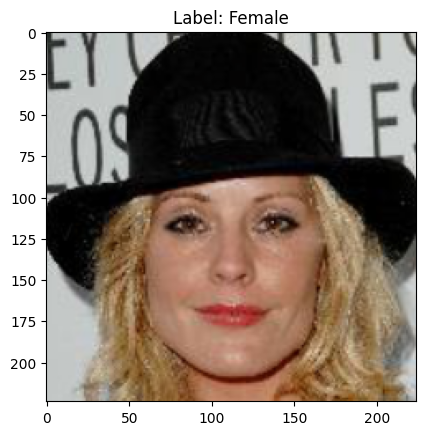

In [ ]:
feature, target = next(iter(testLoader))
print(feature.shape, target.shape)
plt.imshow(inverse_norm(feature[0]).permute(1,2,0))
plt.title(f"Label: {'Male' if target[0] == 1 else ('Female')}")
plt.show()


In [ ]:
label2cat = train_set.classes
label2cat

['Female', 'Male']

In [ ]:
config = {
    "batch_size": BATCH,
    "crop_size": CROP_SIZE
}

# Training Phase: Setting up Model, Criterion, Optimizer and Callbacks

## Resnet18

In [ ]:
model = resnet18()
model.fc = nn.Sequential(
            nn.Linear(512, 512), 
            nn.ReLU(),
            nn.Dropout(.1),

            nn.Linear(512, 256), 
            nn.ReLU(),
            nn.Dropout(.1),

            nn.Linear(256, 2),
            nn.LogSoftmax()
        )

In [ ]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
model = model.to(device)
criterion = nn.NLLLoss()
optimizer = optim.AdamW(model.parameters(), lr = 1e-3)
callback = Callback(model, config, outdir="Artifacts-ResNet18")

Train: 100%|██████████| 63/63 [07:34<00:00,  7.22s/it]


Summary Train set


train_cost: 0.5545	
train_acc: 0.7133	
train_recall: 0.6224	
train_precision: 0.6676	
train_f1-score: 0.6442	
    

Focus on: f1


Test: 100%|██████████| 16/16 [01:02<00:00,  3.90s/it]


Summary Test set


test_cost: 0.4906	
test_acc: 0.7720	
test_recall: 0.6845	
test_precision: 0.7301	
test_f1-score: 0.7066	
    

Focus on: f1

Epoch     1
Train_cost  = 0.5545 | Test_cost  = 0.4906 | Train_score = 0.6442 | Test_score = 0.7066 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]


Summary Train set


train_cost: 0.4590	
train_acc: 0.7865	
train_recall: 0.7315	
train_precision: 0.7504	
train_f1-score: 0.7408	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.82it/s]


Summary Test set


test_cost: 0.5493	
test_acc: 0.7480	
test_recall: 0.4451	
test_precision: 0.8582	
test_f1-score: 0.5862	
    

Focus on: f1

Epoch     2
Train_cost  = 0.4590 | Test_cost  = 0.5493 | Train_score = 0.7408 | Test_score = 0.5862 |
==> EarlyStop patience =  1 | Best test_score: 0.7066
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]


Summary Train set


train_cost: 0.3752	
train_acc: 0.8350	
train_recall: 0.8013	
train_precision: 0.8028	
train_f1-score: 0.8020	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.80it/s]


Summary Test set


test_cost: 0.9616	
test_acc: 0.6850	
test_recall: 0.2357	
test_precision: 0.9175	
test_f1-score: 0.3750	
    

Focus on: f1

Epoch     3
Train_cost  = 0.3752 | Test_cost  = 0.9616 | Train_score = 0.8020 | Test_score = 0.3750 |
==> EarlyStop patience =  2 | Best test_score: 0.7066
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:34<00:00,  1.82it/s]


Summary Train set


train_cost: 0.2635	
train_acc: 0.8905	
train_recall: 0.8759	
train_precision: 0.8635	
train_f1-score: 0.8697	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.84it/s]


Summary Test set


test_cost: 0.8094	
test_acc: 0.7855	
test_recall: 0.4713	
test_precision: 0.9869	
test_f1-score: 0.6380	
    

Focus on: f1

Epoch     4
Train_cost  = 0.2635 | Test_cost  = 0.8094 | Train_score = 0.8697 | Test_score = 0.6380 |
==> EarlyStop patience =  3 | Best test_score: 0.7066
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]


Summary Train set


train_cost: 0.1950	
train_acc: 0.9184	
train_recall: 0.9209	
train_precision: 0.8876	
train_f1-score: 0.9040	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.84it/s]


Summary Test set


test_cost: 0.2592	
test_acc: 0.8870	
test_recall: 0.7594	
test_precision: 0.9486	
test_f1-score: 0.8435	
    

Focus on: f1

Epoch     5
Train_cost  = 0.1950 | Test_cost  = 0.2592 | Train_score = 0.9040 | Test_score = 0.8435 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:34<00:00,  1.80it/s]


Summary Train set


train_cost: 0.1747	
train_acc: 0.9296	
train_recall: 0.9245	
train_precision: 0.9084	
train_f1-score: 0.9164	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.84it/s]


Summary Test set


test_cost: 0.1806	
test_acc: 0.9225	
test_recall: 0.9414	
test_precision: 0.8749	
test_f1-score: 0.9069	
    

Focus on: f1

Epoch     6
Train_cost  = 0.1747 | Test_cost  = 0.1806 | Train_score = 0.9164 | Test_score = 0.9069 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]


Summary Train set


train_cost: 0.1536	
train_acc: 0.9405	
train_recall: 0.9374	
train_precision: 0.9214	
train_f1-score: 0.9293	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.87it/s]


Summary Test set


test_cost: 0.2183	
test_acc: 0.9090	
test_recall: 0.8042	
test_precision: 0.9627	
test_f1-score: 0.8764	
    

Focus on: f1

Epoch     7
Train_cost  = 0.1536 | Test_cost  = 0.2183 | Train_score = 0.9293 | Test_score = 0.8764 |
==> EarlyStop patience =  1 | Best test_score: 0.9069
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]


Summary Train set


train_cost: 0.1342	
train_acc: 0.9451	
train_recall: 0.9491	
train_precision: 0.9217	
train_f1-score: 0.9352	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.85it/s]


Summary Test set


test_cost: 0.2723	
test_acc: 0.9055	
test_recall: 0.7868	
test_precision: 0.9723	
test_f1-score: 0.8697	
    

Focus on: f1

Epoch     8
Train_cost  = 0.1342 | Test_cost  = 0.2723 | Train_score = 0.9352 | Test_score = 0.8697 |
==> EarlyStop patience =  2 | Best test_score: 0.9069
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:34<00:00,  1.81it/s]


Summary Train set


train_cost: 0.1387	
train_acc: 0.9444	
train_recall: 0.9443	
train_precision: 0.9240	
train_f1-score: 0.9340	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.81it/s]


Summary Test set


test_cost: 0.2523	
test_acc: 0.8900	
test_recall: 0.9825	
test_precision: 0.7928	
test_f1-score: 0.8775	
    

Focus on: f1

Epoch     9
Train_cost  = 0.1387 | Test_cost  = 0.2523 | Train_score = 0.9340 | Test_score = 0.8775 |
==> EarlyStop patience =  3 | Best test_score: 0.9069
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]


Summary Train set


train_cost: 0.1227	
train_acc: 0.9524	
train_recall: 0.9521	
train_precision: 0.9350	
train_f1-score: 0.9434	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.96it/s]


Summary Test set


test_cost: 0.1462	
test_acc: 0.9450	
test_recall: 0.9277	
test_precision: 0.9347	
test_f1-score: 0.9312	
    

Focus on: f1

Epoch    10
Train_cost  = 0.1227 | Test_cost  = 0.1462 | Train_score = 0.9434 | Test_score = 0.9312 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.74it/s]


Summary Train set


train_cost: 0.1141	
train_acc: 0.9556	
train_recall: 0.9506	
train_precision: 0.9435	
train_f1-score: 0.9470	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.06it/s]


Summary Test set


test_cost: 0.1709	
test_acc: 0.9335	
test_recall: 0.8865	
test_precision: 0.9442	
test_f1-score: 0.9145	
    

Focus on: f1

Epoch    11
Train_cost  = 0.1141 | Test_cost  = 0.1709 | Train_score = 0.9470 | Test_score = 0.9145 |
==> EarlyStop patience =  1 | Best test_score: 0.9312
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.74it/s]


Summary Train set


train_cost: 0.1044	
train_acc: 0.9576	
train_recall: 0.9524	
train_precision: 0.9464	
train_f1-score: 0.9494	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.27it/s]


Summary Test set


test_cost: 0.1951	
test_acc: 0.9315	
test_recall: 0.9663	
test_precision: 0.8757	
test_f1-score: 0.9188	
    

Focus on: f1

Epoch    12
Train_cost  = 0.1044 | Test_cost  = 0.1951 | Train_score = 0.9494 | Test_score = 0.9188 |
==> EarlyStop patience =  2 | Best test_score: 0.9312
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.73it/s]


Summary Train set


train_cost: 0.1010	
train_acc: 0.9584	
train_recall: 0.9604	
train_precision: 0.9410	
train_f1-score: 0.9506	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.19it/s]


Summary Test set


test_cost: 0.3118	
test_acc: 0.9115	
test_recall: 0.8030	
test_precision: 0.9713	
test_f1-score: 0.8792	
    

Focus on: f1

Epoch    13
Train_cost  = 0.1010 | Test_cost  = 0.3118 | Train_score = 0.9506 | Test_score = 0.8792 |
==> EarlyStop patience =  3 | Best test_score: 0.9312
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:37<00:00,  1.68it/s]


Summary Train set


train_cost: 0.1035	
train_acc: 0.9613	
train_recall: 0.9643	
train_precision: 0.9440	
train_f1-score: 0.9540	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.17it/s]


Summary Test set


test_cost: 0.1177	
test_acc: 0.9545	
test_recall: 0.9576	
test_precision: 0.9309	
test_f1-score: 0.9441	
    

Focus on: f1

Epoch    14
Train_cost  = 0.1035 | Test_cost  = 0.1177 | Train_score = 0.9540 | Test_score = 0.9441 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:37<00:00,  1.66it/s]


Summary Train set


train_cost: 0.0924	
train_acc: 0.9646	
train_recall: 0.9652	
train_precision: 0.9507	
train_f1-score: 0.9579	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.10it/s]


Summary Test set


test_cost: 0.1205	
test_acc: 0.9560	
test_recall: 0.9501	
test_precision: 0.9407	
test_f1-score: 0.9454	
    

Focus on: f1

Epoch    15
Train_cost  = 0.0924 | Test_cost  = 0.1205 | Train_score = 0.9579 | Test_score = 0.9454 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:37<00:00,  1.70it/s]


Summary Train set


train_cost: 0.0892	
train_acc: 0.9640	
train_recall: 0.9628	
train_precision: 0.9514	
train_f1-score: 0.9571	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.80it/s]


Summary Test set


test_cost: 0.1508	
test_acc: 0.9375	
test_recall: 0.8753	
test_precision: 0.9656	
test_f1-score: 0.9182	
    

Focus on: f1

Epoch    16
Train_cost  = 0.0892 | Test_cost  = 0.1508 | Train_score = 0.9571 | Test_score = 0.9182 |
==> EarlyStop patience =  1 | Best test_score: 0.9454
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.72it/s]


Summary Train set


train_cost: 0.0921	
train_acc: 0.9657	
train_recall: 0.9637	
train_precision: 0.9546	
train_f1-score: 0.9591	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]


Summary Test set


test_cost: 0.2508	
test_acc: 0.9165	
test_recall: 0.9875	
test_precision: 0.8346	
test_f1-score: 0.9046	
    

Focus on: f1

Epoch    17
Train_cost  = 0.0921 | Test_cost  = 0.2508 | Train_score = 0.9591 | Test_score = 0.9046 |
==> EarlyStop patience =  2 | Best test_score: 0.9454
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.74it/s]


Summary Train set


train_cost: 0.0820	
train_acc: 0.9692	
train_recall: 0.9667	
train_precision: 0.9598	
train_f1-score: 0.9633	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:09<00:00,  1.77it/s]


Summary Test set


test_cost: 0.1171	
test_acc: 0.9595	
test_recall: 0.9414	
test_precision: 0.9569	
test_f1-score: 0.9491	
    

Focus on: f1

Epoch    18
Train_cost  = 0.0820 | Test_cost  = 0.1171 | Train_score = 0.9633 | Test_score = 0.9491 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]


Summary Train set


train_cost: 0.0805	
train_acc: 0.9696	
train_recall: 0.9676	
train_precision: 0.9599	
train_f1-score: 0.9637	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]


Summary Test set


test_cost: 0.1529	
test_acc: 0.9505	
test_recall: 0.9015	
test_precision: 0.9731	
test_f1-score: 0.9359	
    

Focus on: f1

Epoch    19
Train_cost  = 0.0805 | Test_cost  = 0.1529 | Train_score = 0.9637 | Test_score = 0.9359 |
==> EarlyStop patience =  1 | Best test_score: 0.9491
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.74it/s]


Summary Train set


train_cost: 0.0798	
train_acc: 0.9705	
train_recall: 0.9697	
train_precision: 0.9600	
train_f1-score: 0.9648	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.15it/s]


Summary Test set


test_cost: 0.3052	
test_acc: 0.8950	
test_recall: 0.7531	
test_precision: 0.9805	
test_f1-score: 0.8519	
    

Focus on: f1

Epoch    20
Train_cost  = 0.0798 | Test_cost  = 0.3052 | Train_score = 0.9648 | Test_score = 0.8519 |


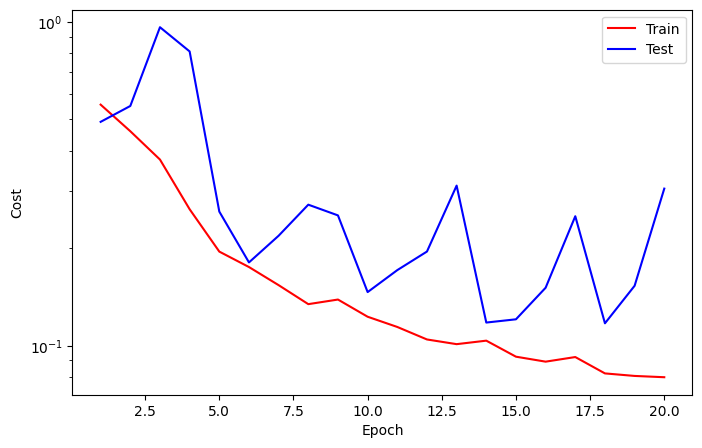

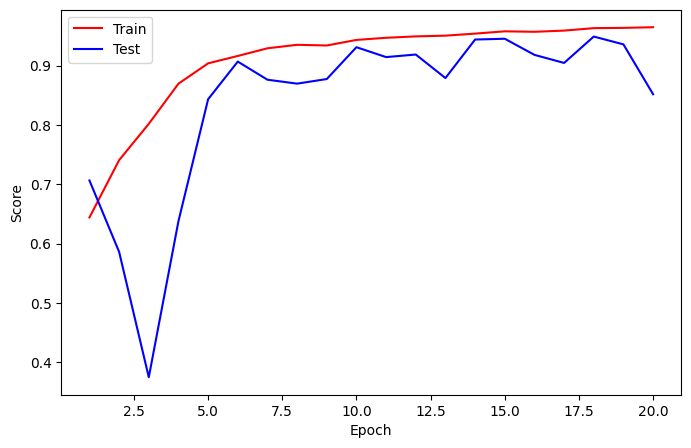

==> EarlyStop patience =  2 | Best test_score: 0.9491
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]


Summary Train set


train_cost: 0.0750	
train_acc: 0.9690	
train_recall: 0.9646	
train_precision: 0.9612	
train_f1-score: 0.9629	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.24it/s]


Summary Test set


test_cost: 0.1364	
test_acc: 0.9570	
test_recall: 0.9277	
test_precision: 0.9637	
test_f1-score: 0.9454	
    

Focus on: f1

Epoch    21
Train_cost  = 0.0750 | Test_cost  = 0.1364 | Train_score = 0.9629 | Test_score = 0.9454 |
==> EarlyStop patience =  3 | Best test_score: 0.9491
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.75it/s]


Summary Train set


train_cost: 0.0695	
train_acc: 0.9722	
train_recall: 0.9682	
train_precision: 0.9653	
train_f1-score: 0.9668	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.17it/s]


Summary Test set


test_cost: 0.1528	
test_acc: 0.9500	
test_recall: 0.9027	
test_precision: 0.9705	
test_f1-score: 0.9354	
    

Focus on: f1

Epoch    22
Train_cost  = 0.0695 | Test_cost  = 0.1528 | Train_score = 0.9668 | Test_score = 0.9354 |
==> EarlyStop patience =  4 | Best test_score: 0.9491
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.74it/s]


Summary Train set


train_cost: 0.0706	
train_acc: 0.9736	
train_recall: 0.9730	
train_precision: 0.9641	
train_f1-score: 0.9685	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.22it/s]


Summary Test set


test_cost: 0.1193	
test_acc: 0.9535	
test_recall: 0.9401	
test_precision: 0.9437	
test_f1-score: 0.9419	
    

Focus on: f1

Epoch    23
Train_cost  = 0.0706 | Test_cost  = 0.1193 | Train_score = 0.9685 | Test_score = 0.9419 |
==> EarlyStop patience =  5 | Best test_score: 0.9491
==> Execute Early Stopping at epoch: 23 | Best test_score: 0.9491
==> Best model is saved at Artifacts-ResNet18


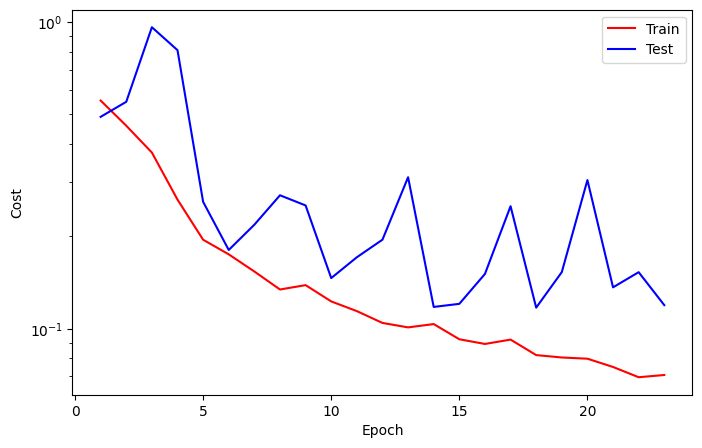

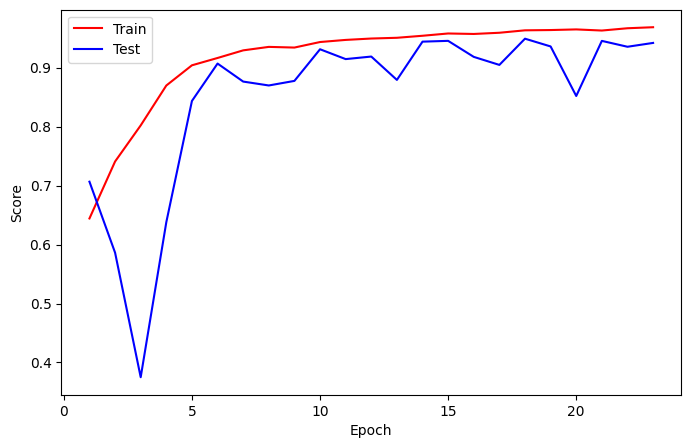

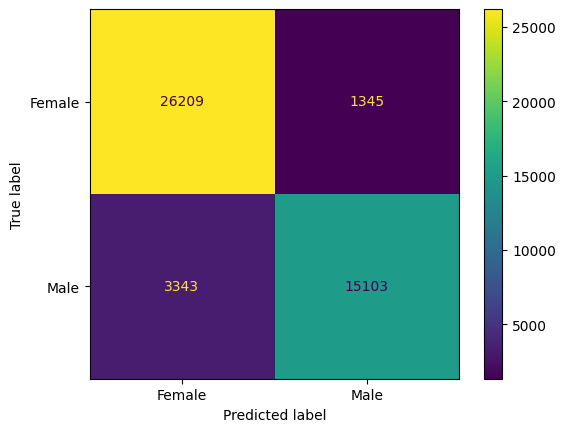

In [ ]:
def fit_predict():
  CM = 0
  while True:
      train_cost, train_score = loop_fn("train", train_set, trainLoader, model, criterion, optimizer, device, focus_on = 'f1')
      with torch.no_grad():
          test_cost, test_score, CM_test = loop_fn("test", test_set, testLoader, model, criterion, optimizer, device, focus_on = 'f1')
          CM += CM_test
        

      ## LOGGING
      callback.log(train_cost, test_cost, train_score, test_score)

      ## Checkpoint
      callback.save_checkpoint()

      ## Runtime Plotting
      callback.cost_runtime_plotting()
      callback.score_runtime_plotting()

      ## EARLY STOPPING
      if callback.early_stopping(model, monitor='test_score'):
          callback.plot_cost()
          callback.plot_score()
          break

      print(90 * "-")
      print()
      print()
  disp = ConfusionMatrixDisplay(confusion_matrix=CM,
                              display_labels=label2cat)
  disp.plot()
  plt.show()
  return model

if __name__ == '__main__':
  model = fit_predict()

## Load Best Weights for ResNet18

In [ ]:
weights = torch.load("./Artifacts-ResNet18/weights_best.pth", map_location = 'cpu')
model = resnet18()
model.fc = nn.Sequential(
                    nn.Linear(512, 512), 
                    nn.ReLU(),
                    nn.Dropout(.1),

                    nn.Linear(512, 256), 
                    nn.ReLU(),
                    nn.Dropout(.1),

                    nn.Linear(256, 2),
                    nn.LogSoftmax()
                )
model.load_state_dict(weights)
model = model.to(device)

## Predict

In [ ]:
feature, target = next(iter(testLoader))
feature, target = feature.to(device), target.to(device)

with torch.no_grad():
    model.eval() 
    output = model(feature)
    pred_ = output.argmax(1)

pred_

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')

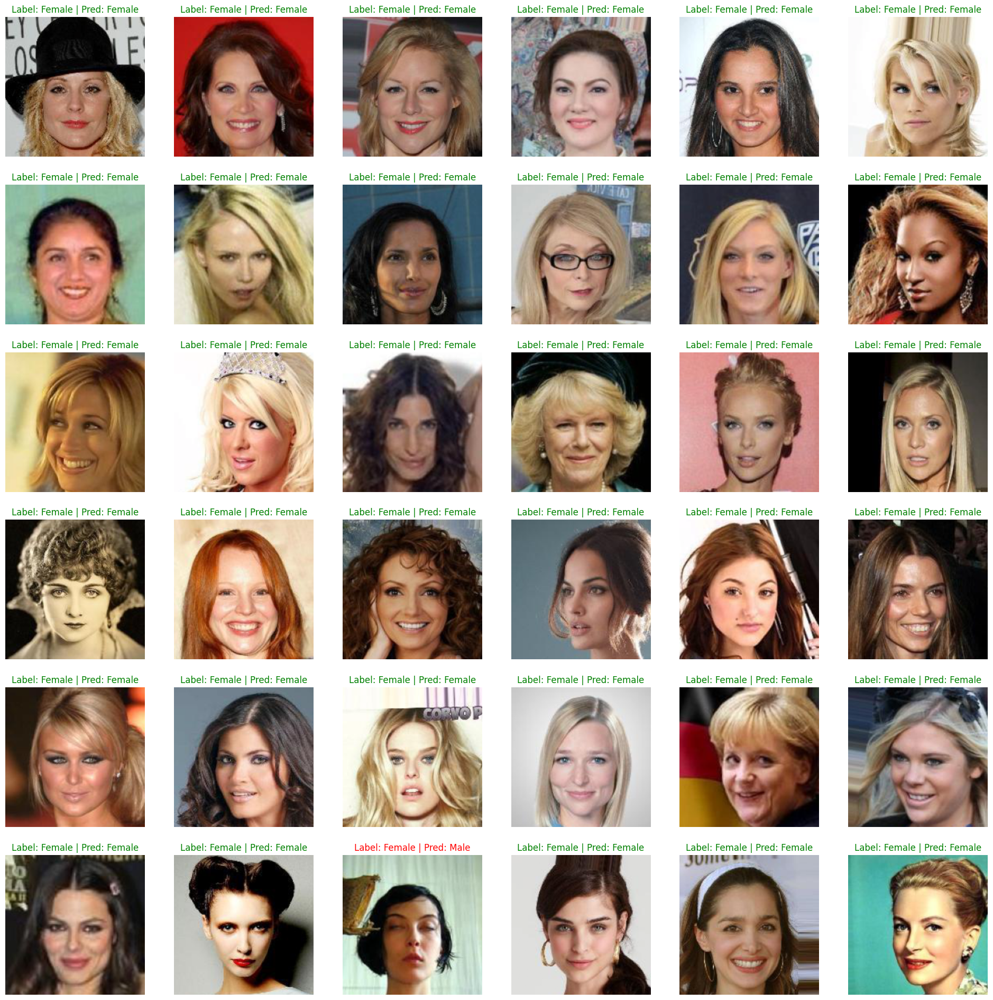

In [ ]:
fig, axes = plt.subplots(6, 6, figsize = (24, 24))
for img, label, pred, ax in zip(feature, target, pred_, axes.flatten()):
    ax.imshow(inverse_norm(img).permute(1,2,0).cpu())
    font = {'color': 'r'} if label != pred else {'color' : 'g'}
    label, pred = label2cat[label.item()], label2cat[pred.item()]
    ax.set_title(f"Label: {label} | Pred: {pred}", fontdict = font)
    ax.axis('off')

# Resnet18 - Transfer Learning

In [ ]:
class CustomResNet18(nn.Module):
  def __init__(self):
    super().__init__()
    self.model = resnet18(pretrained = True)
    self.freeze()
    self.model.fc = nn.Sequential(
            nn.Linear(512, 512), 
            nn.ReLU(),
            nn.Dropout(.1),

            nn.Linear(512, 256), 
            nn.ReLU(),
            nn.Dropout(.1),

            nn.Linear(256, 2),
            nn.LogSoftmax()
        )
  def forward(self, x):
    return self.model(x)

  def freeze(self):
    for param in self.model.parameters():
      param.requires_grad = False

  def unfreeze(self):
    for param in self.model.parameters():
      param.requires_grad = True

In [ ]:
model2 = CustomResNet18()

model2 = model2.to(device)
criterion = nn.NLLLoss()
optimizer = optim.AdamW(model2.parameters(), lr = 1e-3)
callback = Callback(model2, config, outdir="Artifacts-ResNet18-TransferLearning")

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 197MB/s]


Train: 100%|██████████| 63/63 [00:32<00:00,  1.96it/s]


Summary Train set


train_cost: 0.3246	
train_acc: 0.8504	
train_recall: 0.8142	
train_precision: 0.8248	
train_f1-score: 0.8195	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.96it/s]


Summary Test set


test_cost: 0.3011	
test_acc: 0.8690	
test_recall: 0.7020	
test_precision: 0.9608	
test_f1-score: 0.8112	
    

Focus on: f1

Epoch     1
Train_cost  = 0.3246 | Test_cost  = 0.3011 | Train_score = 0.8195 | Test_score = 0.8112 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.98it/s]


Summary Train set


train_cost: 0.2233	
train_acc: 0.9069	
train_recall: 0.8924	
train_precision: 0.8853	
train_f1-score: 0.8888	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.86it/s]


Summary Test set


test_cost: 0.1935	
test_acc: 0.9160	
test_recall: 0.9239	
test_precision: 0.8738	
test_f1-score: 0.8982	
    

Focus on: f1

Epoch     2
Train_cost  = 0.2233 | Test_cost  = 0.1935 | Train_score = 0.8888 | Test_score = 0.8982 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.97it/s]


Summary Train set


train_cost: 0.2240	
train_acc: 0.9065	
train_recall: 0.8936	
train_precision: 0.8836	
train_f1-score: 0.8886	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.80it/s]


Summary Test set


test_cost: 0.2114	
test_acc: 0.9210	
test_recall: 0.8591	
test_precision: 0.9387	
test_f1-score: 0.8971	
    

Focus on: f1

Epoch     3
Train_cost  = 0.2240 | Test_cost  = 0.2114 | Train_score = 0.8886 | Test_score = 0.8971 |
==> EarlyStop patience =  1 | Best test_score: 0.8982
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.98it/s]


Summary Train set


train_cost: 0.2169	
train_acc: 0.9096	
train_recall: 0.9014	
train_precision: 0.8842	
train_f1-score: 0.8927	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.78it/s]


Summary Test set


test_cost: 0.1862	
test_acc: 0.9220	
test_recall: 0.9077	
test_precision: 0.8988	
test_f1-score: 0.9032	
    

Focus on: f1

Epoch     4
Train_cost  = 0.2169 | Test_cost  = 0.1862 | Train_score = 0.8927 | Test_score = 0.9032 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.97it/s]


Summary Train set


train_cost: 0.2085	
train_acc: 0.9123	
train_recall: 0.9026	
train_precision: 0.8888	
train_f1-score: 0.8956	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.79it/s]


Summary Test set


test_cost: 0.2046	
test_acc: 0.9195	
test_recall: 0.8653	
test_precision: 0.9290	
test_f1-score: 0.8961	
    

Focus on: f1

Epoch     5
Train_cost  = 0.2085 | Test_cost  = 0.2046 | Train_score = 0.8956 | Test_score = 0.8961 |
==> EarlyStop patience =  1 | Best test_score: 0.9032
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.98it/s]


Summary Train set


train_cost: 0.2040	
train_acc: 0.9129	
train_recall: 0.8996	
train_precision: 0.8924	
train_f1-score: 0.8960	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.23it/s]


Summary Test set


test_cost: 0.1955	
test_acc: 0.9165	
test_recall: 0.9439	
test_precision: 0.8612	
test_f1-score: 0.9007	
    

Focus on: f1

Epoch     6
Train_cost  = 0.2040 | Test_cost  = 0.1955 | Train_score = 0.8960 | Test_score = 0.9007 |
==> EarlyStop patience =  2 | Best test_score: 0.9032
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:33<00:00,  1.87it/s]


Summary Train set


train_cost: 0.2059	
train_acc: 0.9183	
train_recall: 0.9086	
train_precision: 0.8968	
train_f1-score: 0.9026	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.18it/s]


Summary Test set


test_cost: 0.1896	
test_acc: 0.9260	
test_recall: 0.8903	
test_precision: 0.9225	
test_f1-score: 0.9061	
    

Focus on: f1

Epoch     7
Train_cost  = 0.2059 | Test_cost  = 0.1896 | Train_score = 0.9026 | Test_score = 0.9061 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:32<00:00,  1.91it/s]


Summary Train set


train_cost: 0.1991	
train_acc: 0.9187	
train_recall: 0.9080	
train_precision: 0.8983	
train_f1-score: 0.9031	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  2.00it/s]


Summary Test set


test_cost: 0.1792	
test_acc: 0.9275	
test_recall: 0.9239	
test_precision: 0.8982	
test_f1-score: 0.9109	
    

Focus on: f1

Epoch     8
Train_cost  = 0.1991 | Test_cost  = 0.1792 | Train_score = 0.9031 | Test_score = 0.9109 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.97it/s]


Summary Train set


train_cost: 0.1968	
train_acc: 0.9173	
train_recall: 0.9059	
train_precision: 0.8968	
train_f1-score: 0.9013	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.84it/s]


Summary Test set


test_cost: 0.1877	
test_acc: 0.9220	
test_recall: 0.9414	
test_precision: 0.8738	
test_f1-score: 0.9064	
    

Focus on: f1

Epoch     9
Train_cost  = 0.1968 | Test_cost  = 0.1877 | Train_score = 0.9013 | Test_score = 0.9064 |
==> EarlyStop patience =  1 | Best test_score: 0.9109
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.99it/s]


Summary Train set


train_cost: 0.1866	
train_acc: 0.9216	
train_recall: 0.9086	
train_precision: 0.9040	
train_f1-score: 0.9063	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.78it/s]


Summary Test set


test_cost: 0.1926	
test_acc: 0.9270	
test_recall: 0.8778	
test_precision: 0.9362	
test_f1-score: 0.9060	
    

Focus on: f1

Epoch    10
Train_cost  = 0.1866 | Test_cost  = 0.1926 | Train_score = 0.9063 | Test_score = 0.9060 |
==> EarlyStop patience =  2 | Best test_score: 0.9109
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.98it/s]


Summary Train set


train_cost: 0.1818	
train_acc: 0.9244	
train_recall: 0.9113	
train_precision: 0.9078	
train_f1-score: 0.9095	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]


Summary Test set


test_cost: 0.1826	
test_acc: 0.9245	
test_recall: 0.9239	
test_precision: 0.8917	
test_f1-score: 0.9075	
    

Focus on: f1

Epoch    11
Train_cost  = 0.1818 | Test_cost  = 0.1826 | Train_score = 0.9095 | Test_score = 0.9075 |
==> EarlyStop patience =  3 | Best test_score: 0.9109
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:31<00:00,  1.99it/s]


Summary Train set


train_cost: 0.1807	
train_acc: 0.9257	
train_recall: 0.9158	
train_precision: 0.9071	
train_f1-score: 0.9114	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.18it/s]


Summary Test set


test_cost: 0.1750	
test_acc: 0.9275	
test_recall: 0.9190	
test_precision: 0.9021	
test_f1-score: 0.9104	
    

Focus on: f1

Epoch    12
Train_cost  = 0.1807 | Test_cost  = 0.1750 | Train_score = 0.9114 | Test_score = 0.9104 |
==> EarlyStop patience =  4 | Best test_score: 0.9109
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:33<00:00,  1.88it/s]


Summary Train set


train_cost: 0.1811	
train_acc: 0.9284	
train_recall: 0.9176	
train_precision: 0.9113	
train_f1-score: 0.9144	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.20it/s]


Summary Test set


test_cost: 0.1888	
test_acc: 0.9300	
test_recall: 0.8903	
test_precision: 0.9321	
test_f1-score: 0.9107	
    

Focus on: f1

Epoch    13
Train_cost  = 0.1811 | Test_cost  = 0.1888 | Train_score = 0.9144 | Test_score = 0.9107 |
==> EarlyStop patience =  5 | Best test_score: 0.9109
==> Execute Early Stopping at epoch: 13 | Best test_score: 0.9109
==> Best model is saved at Artifacts-ResNet18-TransferLearning


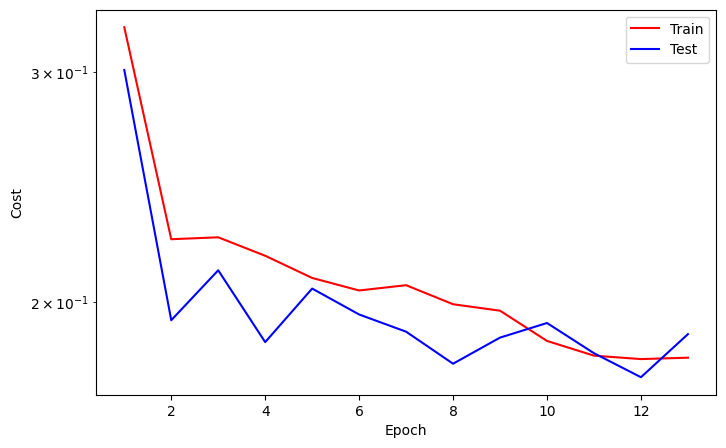

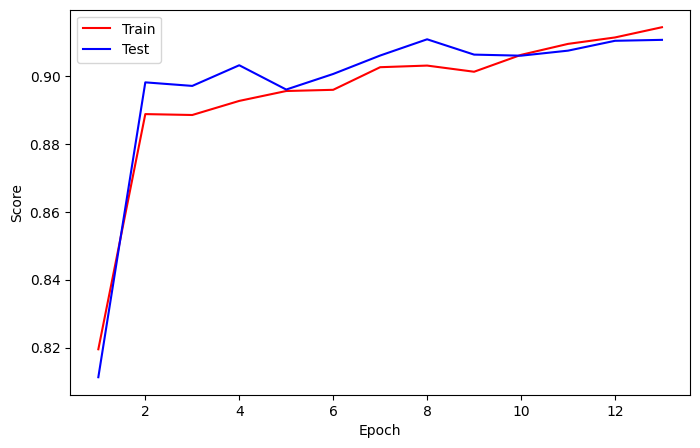

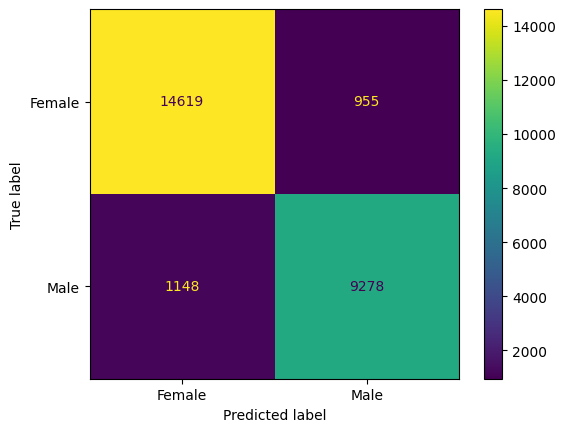

In [ ]:
def fit_predict():
  CM = 0
  while True:
      train_cost, train_score = loop_fn("train", train_set, trainLoader, model2, criterion, optimizer, device, focus_on = 'f1')
      with torch.no_grad():
          test_cost, test_score, CM_test = loop_fn("test", test_set, testLoader, model2, criterion, optimizer, device, focus_on = 'f1')
          CM += CM_test
        

      ## LOGGING
      callback.log(train_cost, test_cost, train_score, test_score)

      ## Checkpoint
      callback.save_checkpoint()

      ## Runtime Plotting
      callback.cost_runtime_plotting()
      callback.score_runtime_plotting()

      ## EARLY STOPPING
      if callback.early_stopping(model, monitor='test_score'):
          callback.plot_cost()
          callback.plot_score()
          break

      print(90 * "-")
      print()
      print()
  disp = ConfusionMatrixDisplay(confusion_matrix=CM,
                              display_labels=label2cat)
  disp.plot()
  plt.show()
  return model2

if __name__ == '__main__':
  model2 = fit_predict()

## Load best weight for Pretrained ResNet18

In [ ]:
weights = torch.load("./Artifacts-ResNet18-TransferLearning/weights_best.pth", map_location = 'cpu')
model2 = resnet18()
model2.fc = nn.Sequential(
                    nn.Linear(512, 512), 
                    nn.ReLU(),
                    nn.Dropout2d(.1),

                    nn.Linear(512, 256), 
                    nn.ReLU(),
                    nn.Dropout2d(.1),

                    nn.Linear(256, 2),
                    nn.LogSoftmax()
                )
model2.load_state_dict(weights)
model2 = model2.to(device)

## Predict

In [ ]:
feature, target = next(iter(testLoader))
feature, target = feature.to(device), target.to(device)

with torch.no_grad():
    model2.eval() 
    output = model2(feature)
    pred_ = output.argmax(1)

pred_

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')

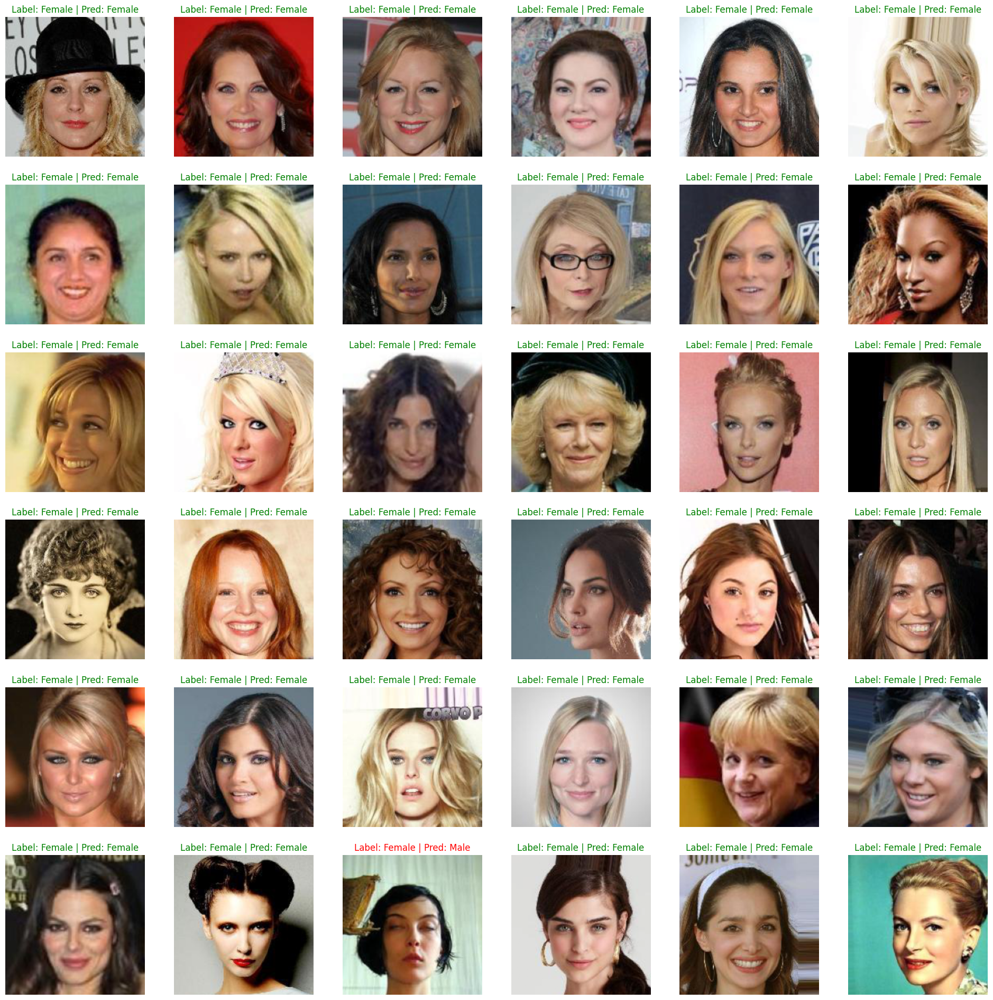

In [ ]:
fig, axes = plt.subplots(6, 6, figsize = (24, 24))
for img, label, pred, ax in zip(feature, target, pred_, axes.flatten()):
    ax.imshow(inverse_norm(img).permute(1,2,0).cpu())
    font = {'color': 'r'} if label != pred else {'color' : 'g'}
    label, pred = label2cat[label.item()], label2cat[pred.item()]
    ax.set_title(f"Label: {label} | Pred: {pred}", fontdict = font)
    ax.axis('off')

## Fine Tuning Pretrained - ResNet18

In [ ]:
# model2.unfreeze()
optimizer = optim.AdamW(model.parameters(), lr = 1e-5)

callback.reset_early_stop() 
callback.early_stop_patience = 7

Train: 100%|██████████| 63/63 [00:37<00:00,  1.70it/s]


Summary Train set


train_cost: 0.0686	
train_acc: 0.9745	
train_recall: 0.9718	
train_precision: 0.9672	
train_f1-score: 0.9695	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.25it/s]


Summary Test set


test_cost: 0.1232	
test_acc: 0.9575	
test_recall: 0.9314	
test_precision: 0.9614	
test_f1-score: 0.9462	
    

Focus on: f1

Epoch    14
Train_cost  = 0.0686 | Test_cost  = 0.1232 | Train_score = 0.9695 | Test_score = 0.9462 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:37<00:00,  1.69it/s]


Summary Train set


train_cost: 0.0697	
train_acc: 0.9735	
train_recall: 0.9682	
train_precision: 0.9682	
train_f1-score: 0.9682	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.06it/s]


Summary Test set


test_cost: 0.1228	
test_acc: 0.9565	
test_recall: 0.9302	
test_precision: 0.9601	
test_f1-score: 0.9449	
    

Focus on: f1

Epoch    15
Train_cost  = 0.0697 | Test_cost  = 0.1228 | Train_score = 0.9682 | Test_score = 0.9449 |
==> EarlyStop patience =  1 | Best test_score: 0.9462
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.73it/s]


Summary Train set


train_cost: 0.0676	
train_acc: 0.9729	
train_recall: 0.9664	
train_precision: 0.9685	
train_f1-score: 0.9675	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.81it/s]


Summary Test set


test_cost: 0.1201	
test_acc: 0.9585	
test_recall: 0.9377	
test_precision: 0.9580	
test_f1-score: 0.9477	
    

Focus on: f1

Epoch    16
Train_cost  = 0.0676 | Test_cost  = 0.1201 | Train_score = 0.9675 | Test_score = 0.9477 |
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.80it/s]


Summary Train set


train_cost: 0.0674	
train_acc: 0.9728	
train_recall: 0.9694	
train_precision: 0.9654	
train_f1-score: 0.9674	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.78it/s]


Summary Test set


test_cost: 0.1215	
test_acc: 0.9570	
test_recall: 0.9314	
test_precision: 0.9602	
test_f1-score: 0.9456	
    

Focus on: f1

Epoch    17
Train_cost  = 0.0674 | Test_cost  = 0.1215 | Train_score = 0.9674 | Test_score = 0.9456 |
==> EarlyStop patience =  1 | Best test_score: 0.9477
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.78it/s]


Summary Train set


train_cost: 0.0671	
train_acc: 0.9746	
train_recall: 0.9718	
train_precision: 0.9675	
train_f1-score: 0.9697	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.80it/s]


Summary Test set


test_cost: 0.1201	
test_acc: 0.9580	
test_recall: 0.9377	
test_precision: 0.9567	
test_f1-score: 0.9471	
    

Focus on: f1

Epoch    18
Train_cost  = 0.0671 | Test_cost  = 0.1201 | Train_score = 0.9697 | Test_score = 0.9471 |
==> EarlyStop patience =  2 | Best test_score: 0.9477
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.79it/s]


Summary Train set


train_cost: 0.0672	
train_acc: 0.9744	
train_recall: 0.9682	
train_precision: 0.9703	
train_f1-score: 0.9693	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.80it/s]


Summary Test set


test_cost: 0.1234	
test_acc: 0.9575	
test_recall: 0.9314	
test_precision: 0.9614	
test_f1-score: 0.9462	
    

Focus on: f1

Epoch    19
Train_cost  = 0.0672 | Test_cost  = 0.1234 | Train_score = 0.9693 | Test_score = 0.9462 |
==> EarlyStop patience =  3 | Best test_score: 0.9477
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]


Summary Train set


train_cost: 0.0678	
train_acc: 0.9736	
train_recall: 0.9694	
train_precision: 0.9674	
train_f1-score: 0.9684	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:08<00:00,  1.88it/s]


Summary Test set


test_cost: 0.1208	
test_acc: 0.9575	
test_recall: 0.9364	
test_precision: 0.9567	
test_f1-score: 0.9464	
    

Focus on: f1

Epoch    20
Train_cost  = 0.0678 | Test_cost  = 0.1208 | Train_score = 0.9684 | Test_score = 0.9464 |


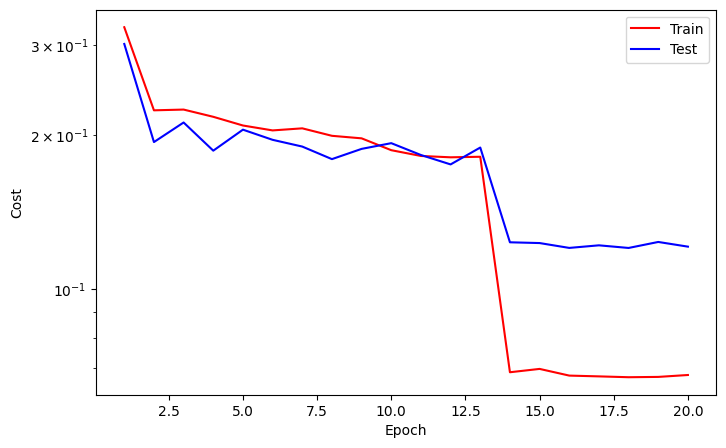

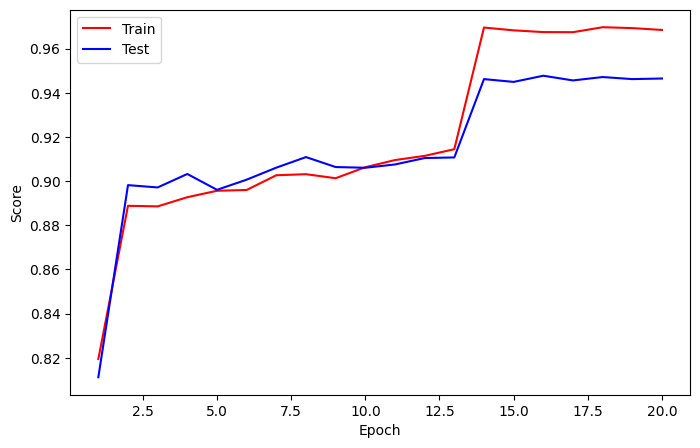

==> EarlyStop patience =  4 | Best test_score: 0.9477
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]


Summary Train set


train_cost: 0.0666	
train_acc: 0.9745	
train_recall: 0.9700	
train_precision: 0.9689	
train_f1-score: 0.9695	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.06it/s]


Summary Test set


test_cost: 0.1225	
test_acc: 0.9575	
test_recall: 0.9314	
test_precision: 0.9614	
test_f1-score: 0.9462	
    

Focus on: f1

Epoch    21
Train_cost  = 0.0666 | Test_cost  = 0.1225 | Train_score = 0.9695 | Test_score = 0.9462 |
==> EarlyStop patience =  5 | Best test_score: 0.9477
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:36<00:00,  1.75it/s]


Summary Train set


train_cost: 0.0665	
train_acc: 0.9749	
train_recall: 0.9676	
train_precision: 0.9720	
train_f1-score: 0.9698	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.26it/s]


Summary Test set


test_cost: 0.1255	
test_acc: 0.9585	
test_recall: 0.9314	
test_precision: 0.9639	
test_f1-score: 0.9474	
    

Focus on: f1

Epoch    22
Train_cost  = 0.0665 | Test_cost  = 0.1255 | Train_score = 0.9698 | Test_score = 0.9474 |
==> EarlyStop patience =  6 | Best test_score: 0.9477
------------------------------------------------------------------------------------------




Train: 100%|██████████| 63/63 [00:35<00:00,  1.76it/s]


Summary Train set


train_cost: 0.0685	
train_acc: 0.9738	
train_recall: 0.9679	
train_precision: 0.9691	
train_f1-score: 0.9685	
    

Focus on: f1


Test: 100%|██████████| 16/16 [00:07<00:00,  2.22it/s]


Summary Test set


test_cost: 0.1247	
test_acc: 0.9575	
test_recall: 0.9314	
test_precision: 0.9614	
test_f1-score: 0.9462	
    

Focus on: f1

Epoch    23
Train_cost  = 0.0685 | Test_cost  = 0.1247 | Train_score = 0.9685 | Test_score = 0.9462 |
==> EarlyStop patience =  7 | Best test_score: 0.9477
==> Execute Early Stopping at epoch: 23 | Best test_score: 0.9477
==> Best model is saved at Artifacts-ResNet18-TransferLearning


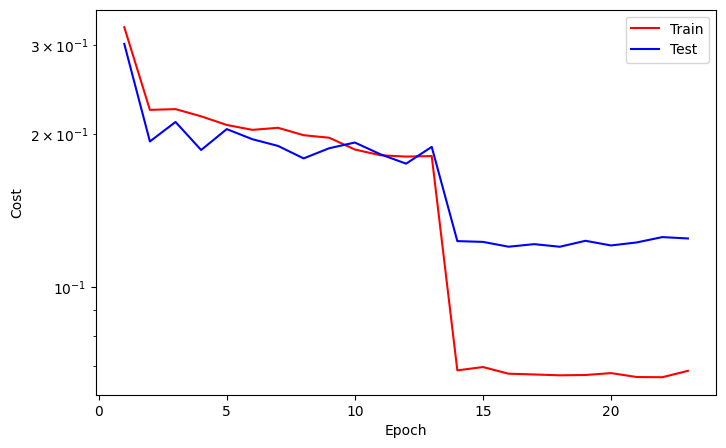

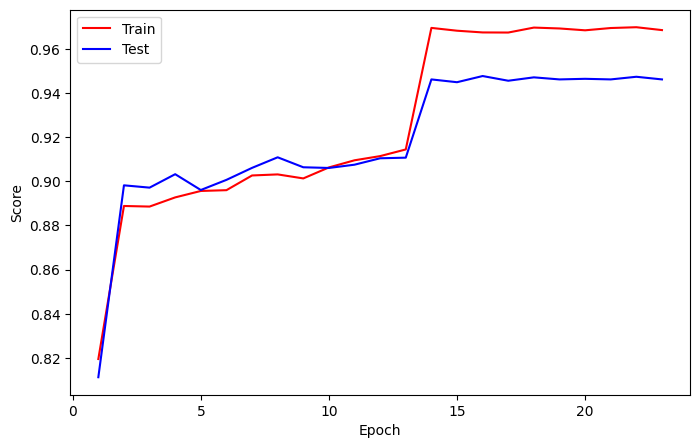

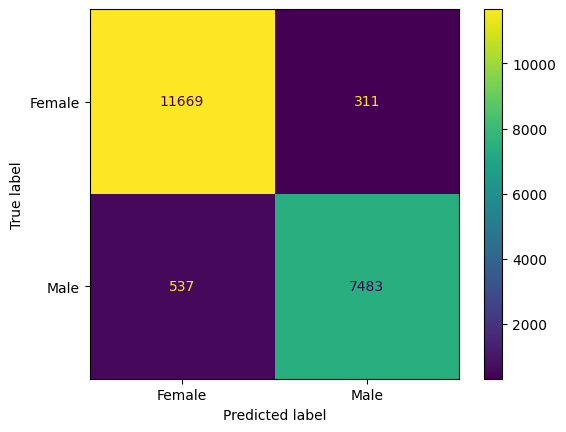

In [ ]:
def fit_predict():
  CM = 0
  while True:
      train_cost, train_score = loop_fn("train", train_set, trainLoader, model2, criterion, optimizer, device, focus_on = 'f1')
      with torch.no_grad():
          test_cost, test_score, CM_test = loop_fn("test", test_set, testLoader, model2, criterion, optimizer, device, focus_on = 'f1')
          CM += CM_test
        

      ## LOGGING
      callback.log(train_cost, test_cost, train_score, test_score)

      ## Checkpoint
      callback.save_checkpoint()

      ## Runtime Plotting
      callback.cost_runtime_plotting()
      callback.score_runtime_plotting()

      ## EARLY STOPPING
      if callback.early_stopping(model, monitor='test_score'):
          callback.plot_cost()
          callback.plot_score()
          break

      print(90 * "-")
      print()
      print()
  disp = ConfusionMatrixDisplay(confusion_matrix=CM,
                              display_labels=label2cat)
  disp.plot()
  plt.show()
  return model2

if __name__ == '__main__':
  model2 = fit_predict()

## Load best Weight After tuning

In [ ]:
weights = torch.load("./Artifacts-ResNet18-TransferLearning/weights_best.pth", map_location = 'cpu')
model2 = resnet18()
model2.fc = nn.Sequential(
                    nn.Linear(512, 512), 
                    nn.ReLU(),
                    nn.Dropout(.1),

                    nn.Linear(512, 256), 
                    nn.ReLU(),
                    nn.Dropout(.1),

                    nn.Linear(256, 2),
                    nn.LogSoftmax()
                )
model2.load_state_dict(weights)
model2 = model2.to(device)

## Predict

In [ ]:
feature, target = next(iter(testLoader))
feature, target = feature.to(device), target.to(device)

with torch.no_grad():
    model2.eval() 
    output = model2(feature)
    pred_ = output.argmax(1)

pred_

tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0], device='cuda:0')

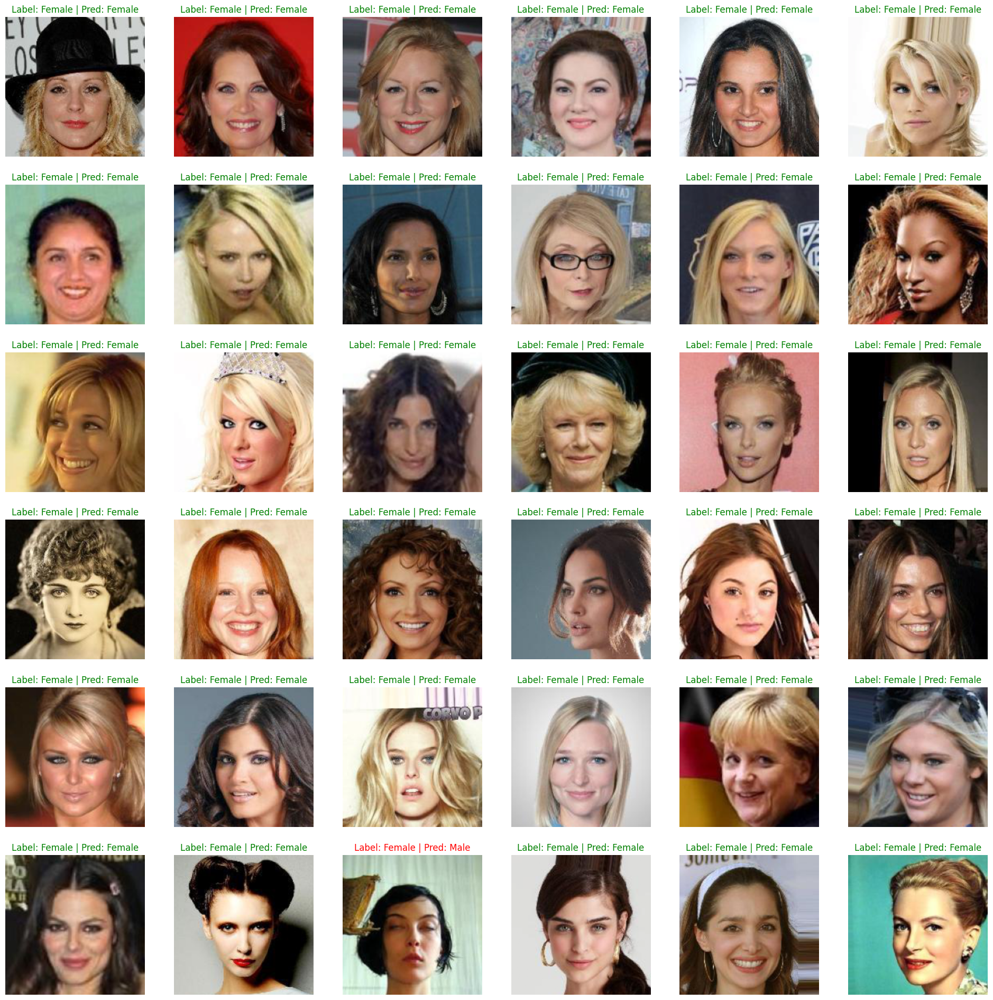

In [ ]:
fig, axes = plt.subplots(6, 6, figsize = (24, 24))
for img, label, pred, ax in zip(feature, target, pred_, axes.flatten()):
    ax.imshow(inverse_norm(img).permute(1,2,0).cpu())
    font = {'color': 'r'} if label != pred else {'color' : 'g'}
    label, pred = label2cat[label.item()], label2cat[pred.item()]
    ax.set_title(f"Label: {label} | Pred: {pred}", fontdict = font)
    ax.axis('off')

## Predict One sample Model 1 - ResNet18

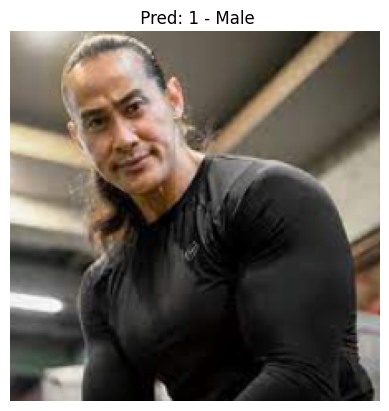

In [ ]:
PREDICT = './Datasets/Test/'
img_test1 = PREDICT + 'test1.jpg'

def predict_one_sample(input_pic, transformer, inverse, model):
  img_test1 = Image.open(input_pic)
  img_test1 = transformer(img_test1).to(device)
  with torch.no_grad():
    model.eval()
    output = model(img_test1.view(1,3,224,224))
    pred_ = output.argmax(1)

  plt.imshow(inverse(img_test1).permute(1,2,0).cpu())
  plt.title(f" Pred: {pred_.item()} - {'Male' if pred_ == 1 else ('Female')}")
  plt.axis('off')
  plt.show()

if __name__ == '__main__':
  predict_one_sample(img_test1, test_transform, inverse_norm, model)

## Predict One Sample Model 2 - ResNet18 - Transfer Learning - Early Stopping - Fine Tuning

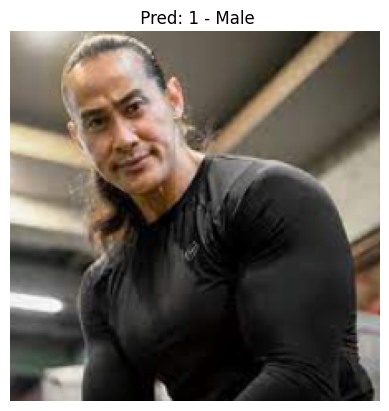

In [ ]:
PREDICT = './Datasets/Test/'
img_test1 = PREDICT + 'test1.jpg'

def predict_one_sample(input_pic, transformer, inverse, model):
  img_test1 = Image.open(input_pic)
  img_test1 = transformer(img_test1).to(device)
  with torch.no_grad():
    model.eval()
    output = model(img_test1.view(1,3,224,224))
    pred_ = output.argmax(1)

  plt.imshow(inverse(img_test1).permute(1,2,0).cpu())
  plt.title(f" Pred: {pred_.item()} - {'Male' if pred_ == 1 else ('Female')}")
  plt.axis('off')
  plt.show()

if __name__ == '__main__':
  predict_one_sample(img_test1, test_transform, inverse_norm, model2)